# Gravitational Search

In the proposed algorithm, the searcher agents are a collection of masses which interact with each other based on the Newtonian gravity and the laws of motion. 

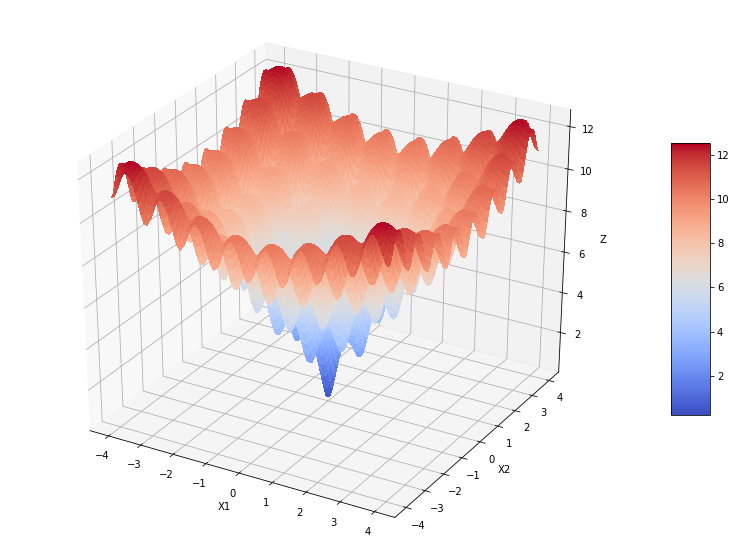

In [132]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from matplotlib import animation
from IPython.display import HTML


def ackley(x1,x2):
    
    a = 20
    
    return -a*(np.exp((-a/100)*np.sqrt(0.5*(x1**2+x2**2)))) - np.exp(0.5*(np.cos(2*np.pi*x1)+np.cos(2*np.pi*x2))) + np.exp(1) + 20

step = 100

x1 = np.linspace(-4, 4, step)
x2 = np.linspace(-4, 4, step)

x1, x2 = np.meshgrid(x1,x2)

z = ackley(x1,x2)

fig = plt.figure(figsize=(14,10))

ax = fig.gca(projection='3d')

surf = ax.plot_surface(x1, x2, z, rstride=1, cstride=1, cmap=plt.cm.coolwarm, linewidth=0, antialiased=False)

fig.colorbar(surf, shrink=0.5, aspect=7, cmap=plt.cm.coolwarm)

ax.set_xlabel('X1')
ax.set_ylabel('X2')
ax.set_zlabel('Z')

plt.show()

## Gravitational Search Algorithm

In [133]:
def inicializa_objetos(lim_superior,lim_inferior,n_individuos):
    
    objetos = np.random.uniform(lim_inferior,lim_superior,size=([n_individuos,2]))

    z_inicial = ackley(objetos[:,0], objetos[:,1])
    
    return objetos, z_inicial

In [134]:
obj, z = inicializa_objetos(4,-4,100)

In [135]:
def avalia(objetos):
    
    z = ackley(objetos[:,0], objetos[:,1])
    
    return z

In [136]:
def best_worst(objetos,z):
    
    best = objetos[np.argmin(z),:]
    
    best_val = np.min(z)
    
    worst = objetos[np.argmax(z),:]
    
    worst_val = np.max(z)
    
    return best, best_val, worst, worst_val
    

In [137]:
def update_g(g0,alfa,itera,max_itera):
    
    g = g0*np.exp(-alfa*(itera/max_itera))
    
    return g

In [138]:
def update_k(itera,max_itera,obj):
    
    massas = len(obj)
    
    k = massas - (massas-1)*itera/max_itera
    
    return int(round(k,0))

In [139]:
def calcula_massas(z, best, worst):
    
    m = (z-worst)/(best-worst)
    
    M = m/np.sum(m)
    
    return M

In [140]:
def calcula_forcas_aceleracao(M,obj,z,e,G,k):
    
  
    m = np.concatenate((obj,z.reshape(1,-1).T), axis=1)
    
    index=np.argsort(m[:,-1])

    
    F = np.zeros(obj.shape)
    a = np.zeros(obj.shape)
    df_m = np.zeros(obj.shape)
    
    
    for i in range(len(M)):
    
        dif = (obj - obj[i,:])

        
        dist = np.sqrt(np.sum(dif**2,axis=1))
      
        
        random = np.random.rand(len(M))
    
        for j in range(obj.shape[1]):

            df_m[:,j] = dif[:,j]*M[i]*M*G*random/(dist+e)

        auxi = np.copy(df_m[index])
        
        F[i] =  np.sum(auxi[:k,:],axis=0)
        a[i] = F[i]/(M[i]+e)
    
    
    
    return F, a
            
  
        

In [165]:
def atualiza_vel(a,v_ant,M,obj):
    
    random = np.random.rand(len(M))
    v_novo=np.zeros(obj.shape)
    
    for j in range(obj.shape[1]):
        v_novo[:,j] = np.random.rand(len(M))*v_ant[:,j] + a[:,j]
    
    return v_novo

In [166]:
def atualiza_posi(v_novo,posi_ant):
    
    p_novo = posi_ant+v_novo
    
    return p_novo

In [188]:
def animate(x1,x2,ims,ax2,mass):
  
    im = ax2.plot(x1,x2,'o')
    ims.append(im)
    return ims

In [189]:
def gravitational_search(max_iteracoes,lim_sup,lim_inf,n_obj, alfa, G0, e):
    
    
    obj, z = inicializa_objetos(lim_sup,lim_inf,n_obj)
    best_vals = []
    coordenadas = []
    z_coordenadas = []
    massas = []
    v_ant = np.zeros(obj.shape)
    fator = 0.25

    for i in range(max_iteracoes):

        coordenadas.append(obj)
        z = avalia(obj)
        z_coordenadas.append(z)
        best, best_val, worst, worst_val = best_worst(obj,z)
        best_vals.append(best_val)
        M = calcula_massas(z, best_val+e, worst_val)
        massas.append(M)
        G = update_g(G0,alfa,i,max_iteracoes)
        k = update_k(i,max_iteracoes,obj)
        F,a = calcula_forcas_aceleracao(M,obj,z,e,G,k)
        vel_novo = atualiza_vel(a,v_ant,M,obj)
        vel_novo[vel_novo>fator*lim_sup] = fator*lim_sup
        vel_novo[vel_novo<fator*lim_inf] = fator*lim_inf
        v_ant = np.copy(vel_novo)
        posi = atualiza_posi(vel_novo,obj)

        
        obj=np.copy(posi)
        obj[obj>lim_sup] = lim_sup
        obj[obj<lim_inf] = lim_inf
        
        valores.append(best_val)

    return best_vals, coordenadas, z_coordenadas, massas


In [273]:
e = 1e-12
max_iteracoes = 50
G0=100
alfa=15
lim_sup = 10
lim_inf = -10
n_obj = 15

best, coord, zcoord, mass = gravitational_search(max_iteracoes,lim_sup,lim_inf,n_obj, alfa, G0, e)

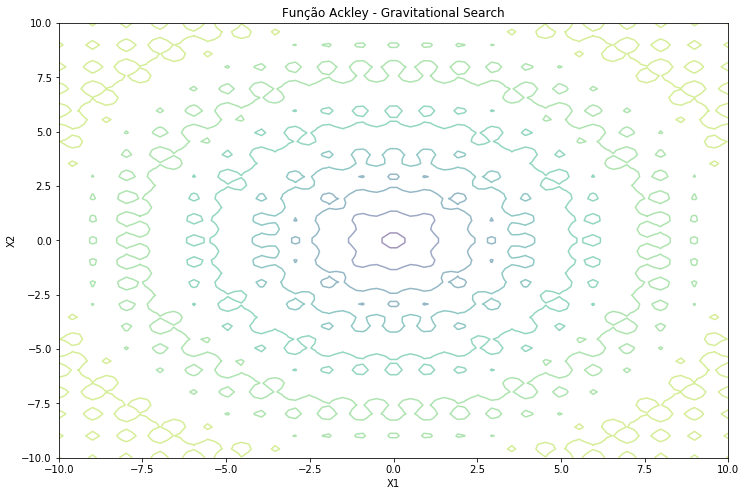

In [274]:
fig, ax = plt.subplots(figsize=(12,8))

step = 100

x1 = np.linspace(-10, 10, step)
x2 = np.linspace(-10, 10, step)

x1, x2 = np.meshgrid(x1,x2)

z = ackley(x1,x2)

plt.contour(x1,x2,z,alpha=0.5)

plt.title('Função Ackley - Gravitational Search')

plt.xlabel('X1')


plt.ylabel('X2')
     
ims = []


# ax2.plot_wireframe(x1,x2,z)

for i in range(len(coord)):

    ims = animate(coord[i][:,0].tolist(),coord[i][:,1].tolist(),ims,ax,mass[i].tolist())

anim = animation.ArtistAnimation(fig,ims, interval=len(coord)*10, repeat_delay=100)

HTML(anim.to_html5_video())

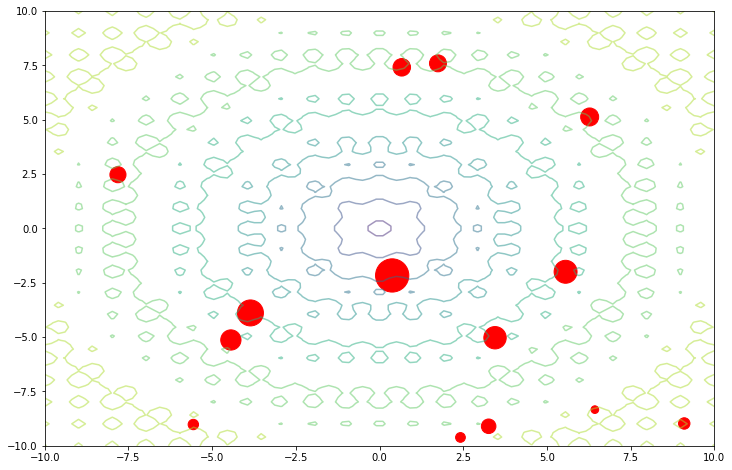

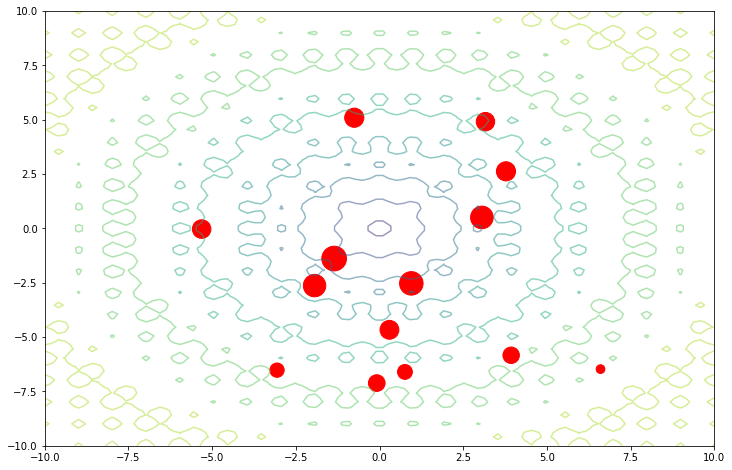

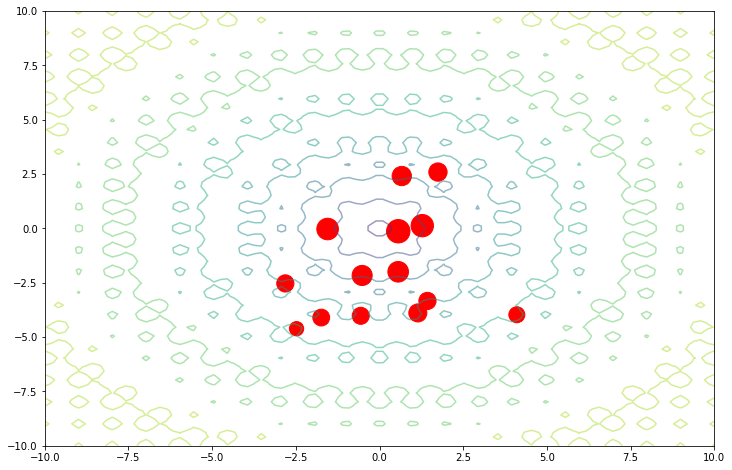

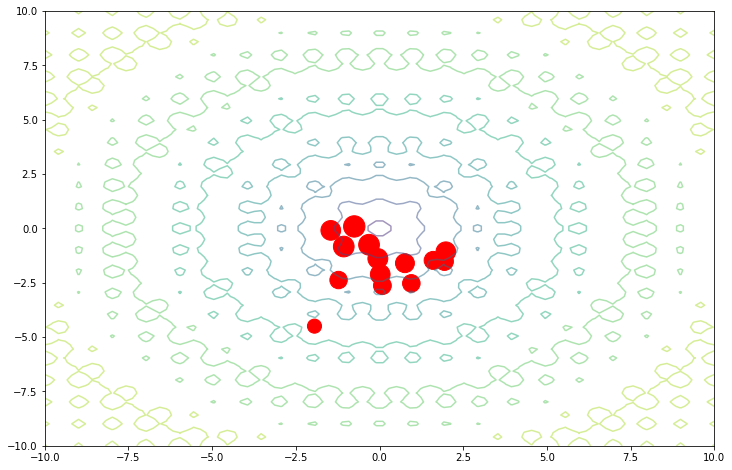

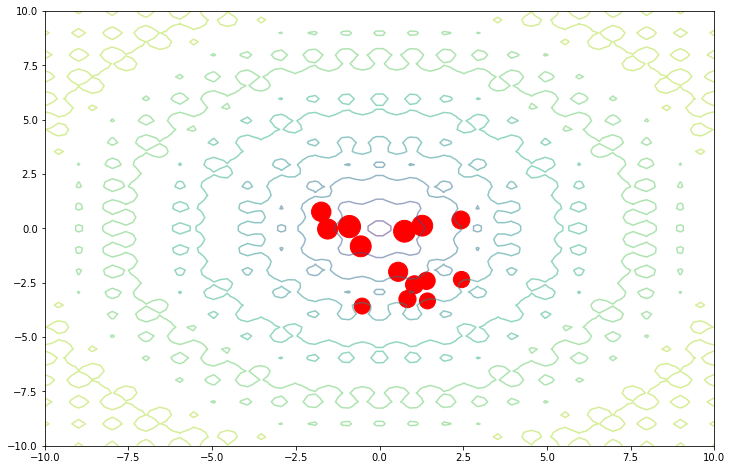

...

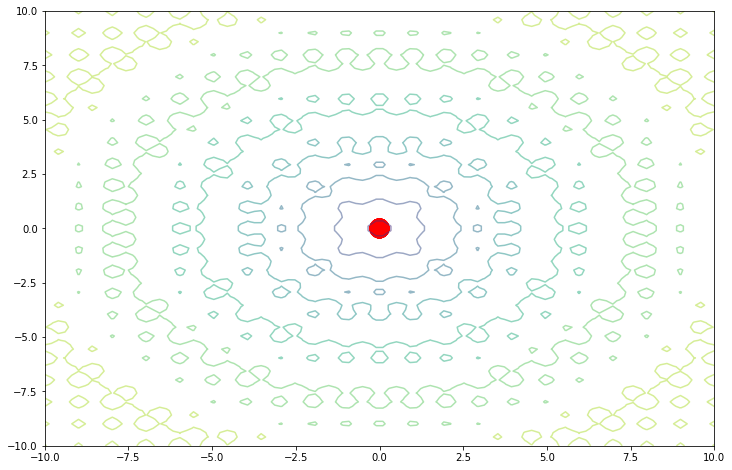

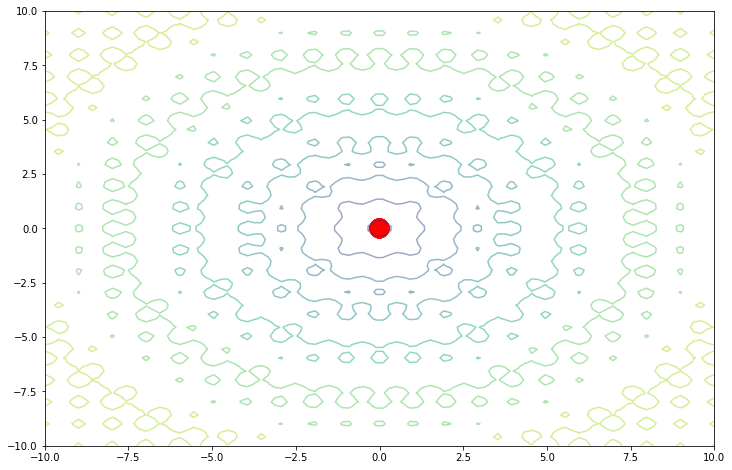

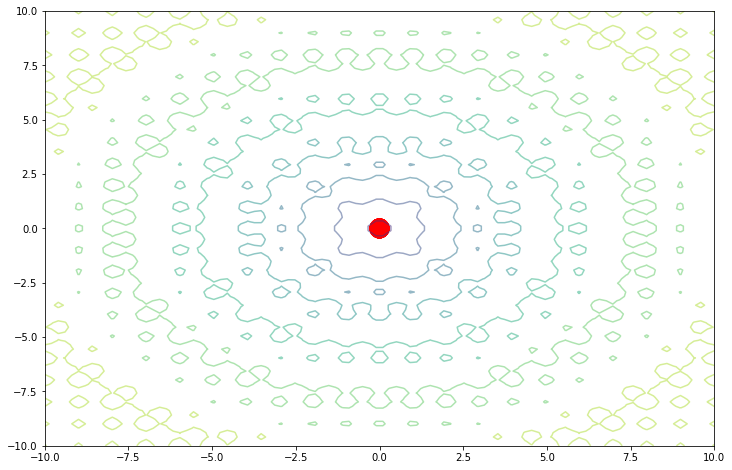

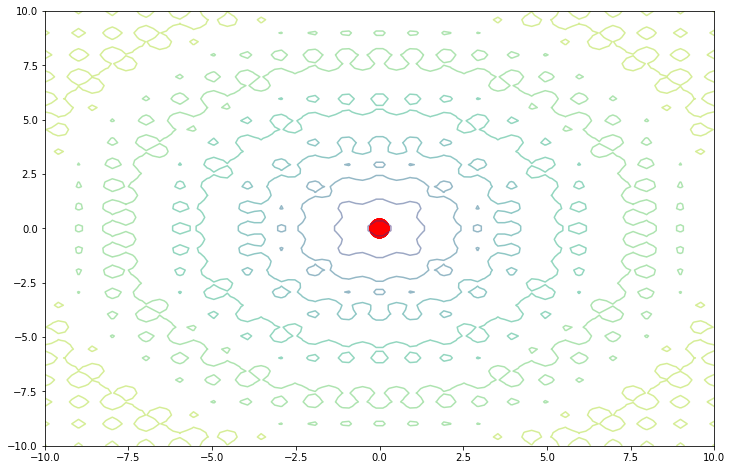

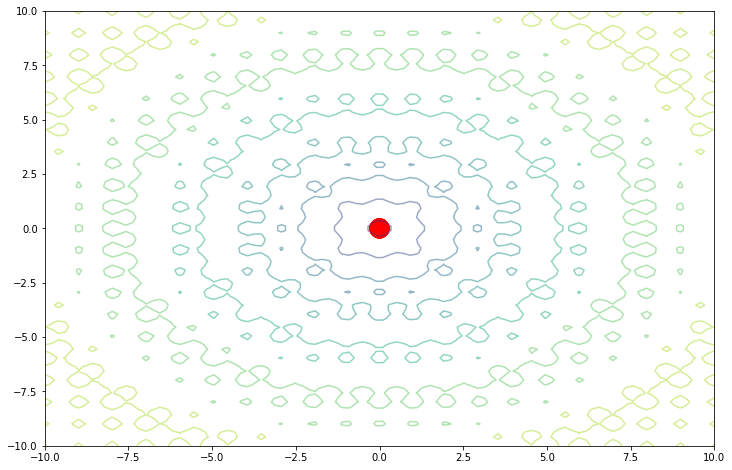

In [275]:
for i in range(len(coord)):
    plt.figure(figsize=(12,8))
    plt.contour(x1,x2,z,alpha=0.5)
    plt.scatter(coord[i][:,0],coord[i][:,1],mass[i]*5000,color='red')
    plt.pause(0.05)

Text(0.5, 1.0, 'Curva de Convergência - Gravitational Search')

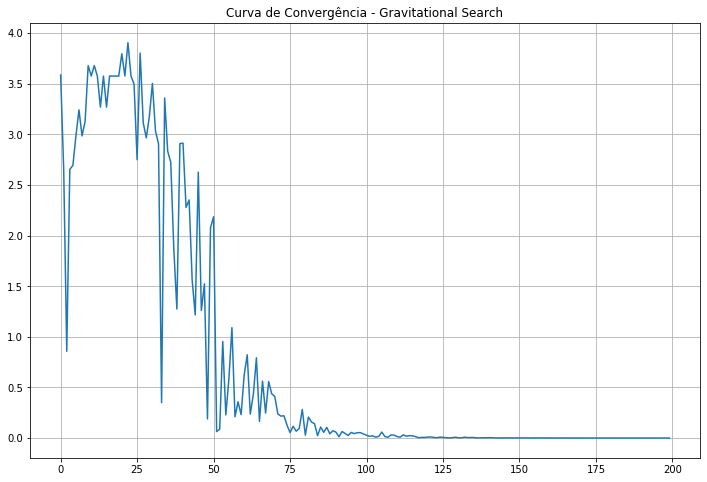

In [276]:
e = 1e-16
max_iteracoes = 200
G0=100
alfa=10
lim_sup = 10
lim_inf = -10
n_obj = 50

best, coord, zcoord, mass = gravitational_search(max_iteracoes,lim_sup,lim_inf,n_obj, alfa, G0, e)

plt.figure(figsize=(12,8))
plt.plot(best)
plt.grid()
plt.title('Curva de Convergência - Gravitational Search')


In [277]:
print(f'Valor Final da Função Objetivo:{np.min(zcoord[-1])}')
print(f'Solução Final:{coord[-1][np.argmin(zcoord[-1]),:]}')

Valor Final da Função Objetivo:3.646270852186717e-05
Solução Final:[-8.84411297e-06 -9.37723182e-06]
